The goal of this work is to find anomaly points in a dataset using different approaches

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap
import time
from tqdm import tqdm

In [2]:
data = pd.read_csv("creditcard.csv")
data.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
data.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [4]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


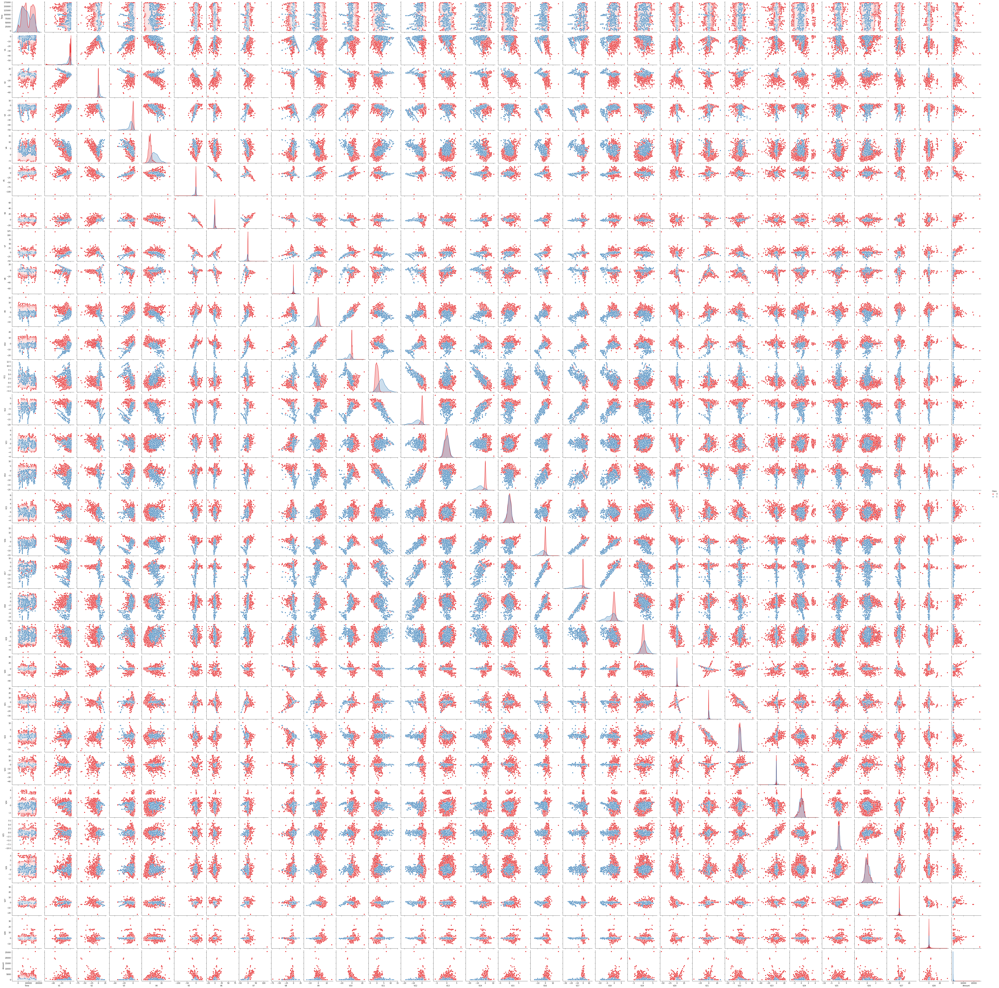

In [5]:
sns.pairplot(data, hue='Class', palette='Set1')

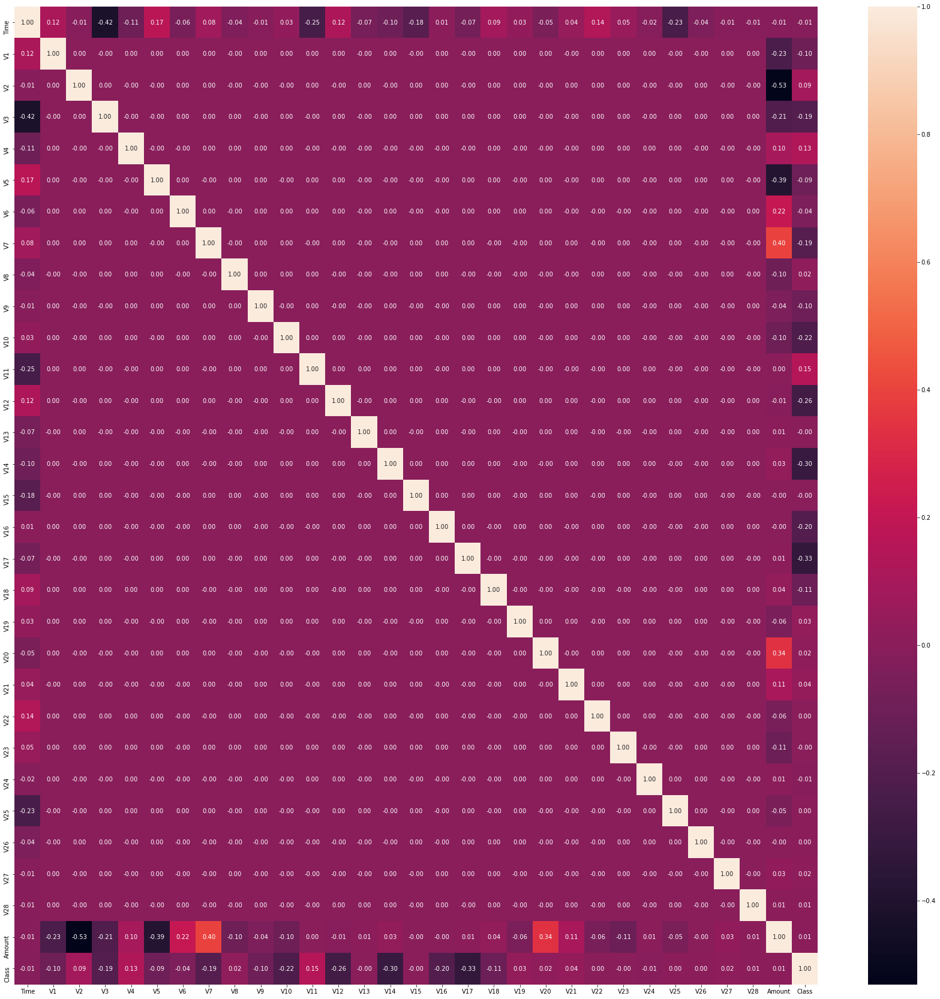

In [6]:
corr = data.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr, annot=True, fmt='.2f')

The 'class' colunms corresponds to belonging of an element to outline points set or not

In [7]:
data['Class'].unique()

array([0, 1], dtype=int64)

In [8]:
len(data[data['Class']==1]), len(data), len(data[data['Class']==0]), len(data[data['Class']==1])/len(data)

(492, 284807, 284315, 0.001727485630620034)

We have 0.173% of outliers. Because the dataset is huge, we will assume that result of a method is good if it cantains from 0.15% to 0.2% of outliers

In [9]:
y = data['Class']
x = data.drop(['Class'], axis=1)

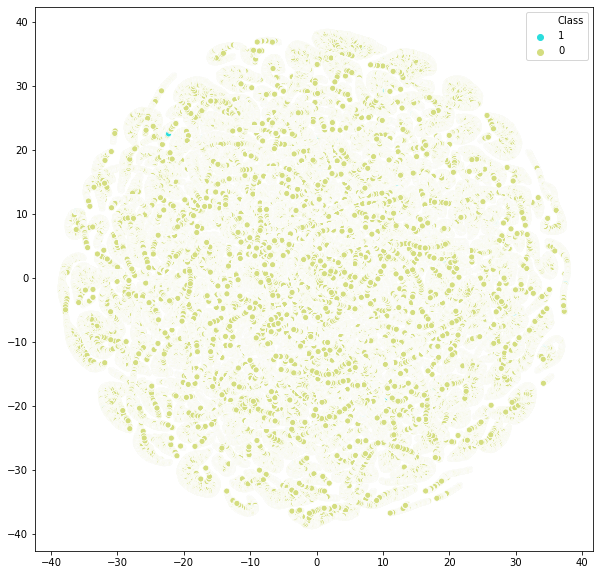

In [10]:
tsne = TSNE(n_components=2)
data_tsne = tsne.fit_transform(data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne[:,0], data_tsne[:,1],hue=data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

It's hard to determine here any outliers because we have one big cluster, but some groups of points are separated from this cluster. However, expert outliers are inside this cluster

## Sigma rule

In [11]:
def sigma_outlires(threshold, data):
    outliers = []
    statistics = data.describe()
    for i in tqdm(range(data.shape[0])):
        outliers.append(0)
        for j in data.columns:
            if ((data[j][i] > statistics[j]['mean'] + threshold * statistics[j]['std']) | (data[j][i] < statistics[j]['mean'] - threshold * statistics[j]['std'])):
                outliers[i] = 1
                break
    return outliers
            

In [12]:
sigma_outliers = sigma_outlires(18, x)

100%|█████████████████████████████████████████████████████████████████████████| 284807/284807 [09:37<00:00, 493.07it/s]


In [13]:
sigma_outliers = pd.Series(sigma_outliers)

In [14]:
sigma_outliers.sum() / len(sigma_outliers)

0.0017485525285544246

In [15]:
sigma_data = x.copy()

In [16]:
sigma_data['Class'] = sigma_outliers

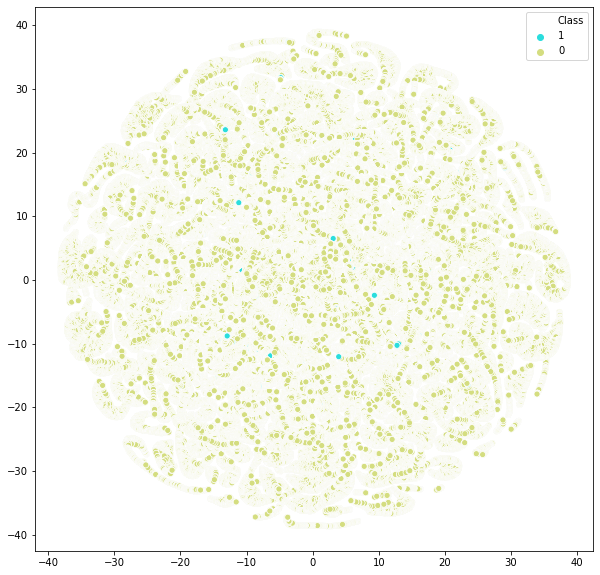

In [17]:
tsne = TSNE(n_components=2)
data_tsne_sigma = tsne.fit_transform(sigma_data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne_sigma[:,0], data_tsne_sigma[:,1],hue=sigma_data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

## Interquantile Range

In [18]:
def IR_outlires(threshold, data):
    outliers = []
    statistics = data.describe()
    IQR = {}
    for i in data.columns:
        IQR[i] = statistics[i]['75%'] - statistics[i]['25%']
    for i in tqdm(range(data.shape[0])):
        outliers.append(0)
        for j in data.columns:
            if ((data[j][i] < statistics[j]['25%'] - threshold * IQR[j]) | (data[j][i] > statistics[j]['75%'] + threshold * IQR[j]) ):
                outliers[i] = 1
                break
    return outliers

In [19]:
IR_outliers = IR_outlires(43, x)

100%|█████████████████████████████████████████████████████████████████████████| 284807/284807 [06:40<00:00, 710.30it/s]


In [20]:
IR_outliers = pd.Series(IR_outliers)
IR_outliers.sum() / len(IR_outliers)

0.0016853518347512526

In [21]:
IR_data = x.copy()
IR_data['Class'] = IR_outliers

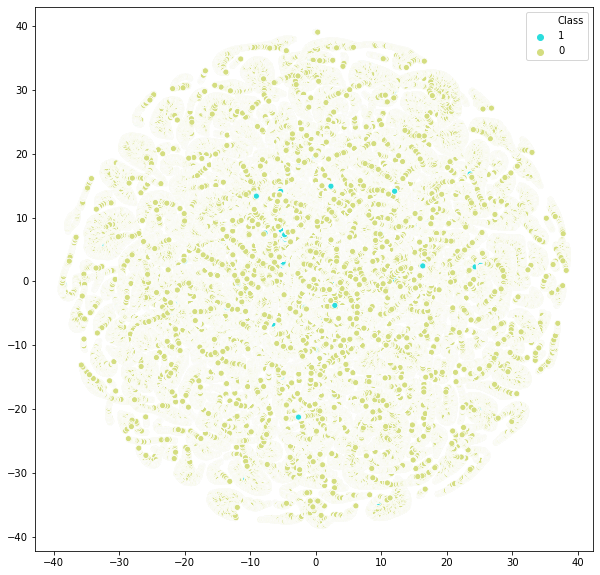

In [22]:
tsne = TSNE(n_components=2)
data_tsne_IR = tsne.fit_transform(IR_data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne_IR[:,0], data_tsne_IR[:,1],hue=IR_data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

## Distance-based

In [23]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [24]:
scaler = RobustScaler()
x_scaled = pd.DataFrame(scaler.fit_transform(x))
x_scaled

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,-0.994983,-0.616237,-0.098602,1.228905,0.878152,-0.217859,0.631245,0.177406,0.142432,0.334787,...,0.910463,0.026866,0.253109,-0.320791,0.032681,0.167619,-0.241182,0.816731,-0.246091,1.783274
1,-0.994983,0.524929,0.143100,-0.006970,0.293974,0.087726,0.164395,-0.105740,0.117064,-0.164482,...,-0.019150,-0.473332,-0.602719,0.363442,-0.479557,0.225462,0.313475,-0.063781,0.026519,-0.269825
2,-0.994972,-0.615587,-1.002407,0.830932,0.251024,-0.344345,1.778007,0.668164,0.420388,-1.179796,...,1.703959,0.668917,0.714254,2.974603,-0.919589,-0.515430,-0.153111,-0.350218,-0.540962,4.983721
3,-0.994972,-0.440239,-0.178789,0.841250,-0.529808,0.033775,1.303832,0.175637,0.662489,-1.076888,...,-0.422194,-0.190105,-0.001408,-0.578786,-1.531963,0.944482,-0.298959,0.379163,0.382611,1.418291
4,-0.994960,-0.526089,0.579239,0.713861,0.265632,-0.270695,0.317183,0.491625,-0.546463,0.700808,...,1.366227,0.048266,0.739092,-0.407980,0.126293,-0.333308,0.976221,1.347133,1.553716,0.670579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,1.034951,-5.321622,7.135767,-5.222589,-1.285699,-4.073679,-1.999082,-4.409307,13.588260,1.585066,...,4.461946,0.585633,0.098124,3.314091,-0.693006,2.126512,0.532055,5.820867,6.190862,-0.296653
284803,1.034963,-0.335820,-0.085979,0.967471,-0.451476,0.707747,1.142041,-0.014027,0.508439,0.512990,...,0.354148,0.587444,0.856848,0.076436,-1.331299,-0.933155,-0.604145,0.414680,-0.493534,0.038986
284804,1.034975,0.850377,-0.261532,-1.788463,-0.337932,2.059687,2.832770,-0.299623,1.280019,0.390154,...,0.185279,0.630455,0.533612,-0.085005,0.754500,0.373060,-0.062034,0.019227,-0.288058,0.641096
284805,1.034975,-0.115629,0.331602,0.272567,0.445763,-0.248270,0.769496,-0.645865,1.225405,0.357606,...,0.550857,0.710499,0.740745,-0.491472,0.103549,-0.877058,1.054357,0.663921,0.710829,-0.167680


In [25]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=99.83)
euclidian_model.fit(x_scaled)
euclidian_outliers = euclidian_model.predict(x_scaled)

In [26]:
euclidian_outliers.sum() / len(euclidian_outliers)

0.0017029075830299115

In [27]:
distance_data = x.copy()
distance_data['Class'] = euclidian_outliers

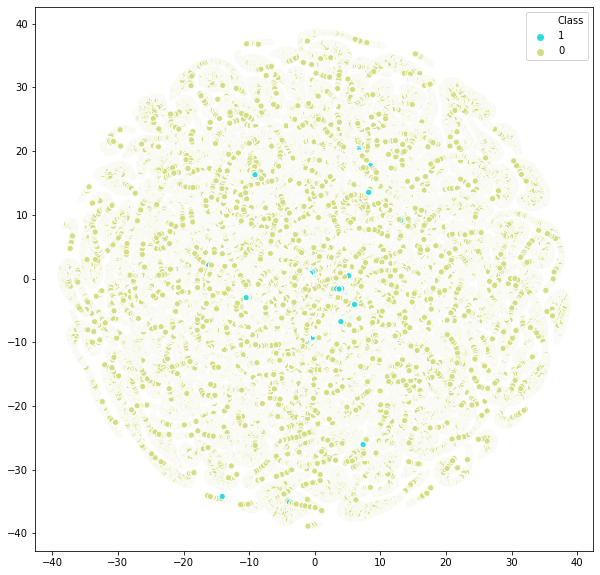

In [28]:
tsne = TSNE(n_components=2)
data_tsne_distance = tsne.fit_transform(distance_data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne_distance[:,0], data_tsne_distance[:,1], distance_data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

## SMV

In [29]:
from sklearn.svm import OneClassSVM

In [30]:
%%time
svm = OneClassSVM(nu=0.002, kernel="sigmoid")
svm.fit(x_scaled)
svm_outliers = svm.predict(x_scaled)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

Wall time: 39.4 s


In [31]:
svm_outliers.sum() / len(svm_outliers)

0.0019978441541113807

In [32]:
svm_data = x.copy()
svm_data['Class'] = svm_outliers

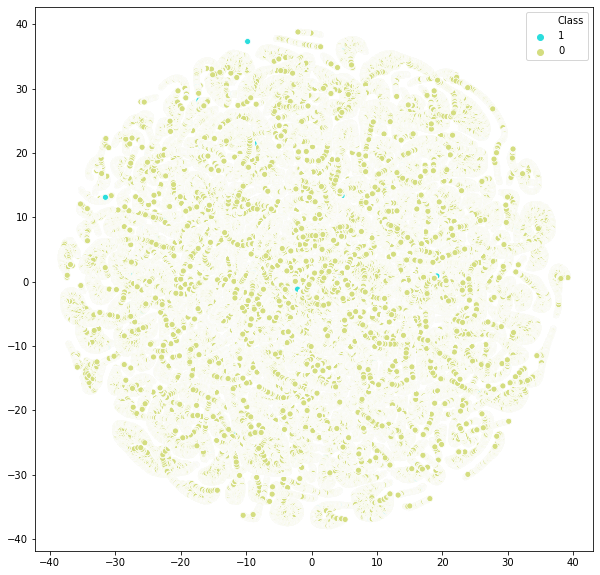

In [33]:
tsne = TSNE(n_components=2)
data_tsne_svm = tsne.fit_transform(svm_data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne_svm[:,0], data_tsne_svm[:,1], svm_data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

## Isolation Forest

In [34]:
from sklearn.ensemble import IsolationForest

In [35]:
%%time
isolation_forest = IsolationForest(n_estimators=100, contamination=0.0017, 
                                   max_features=1.0, bootstrap=True)
isolation_forest.fit(x_scaled)

isolation_outliers = isolation_forest.predict(x_scaled)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

Wall time: 24 s


In [36]:
isolation_outliers.sum() / len(isolation_outliers)

0.0017029075830299115

In [37]:
isolation_forest_data = x.copy()
isolation_forest_data['Class'] = isolation_outliers

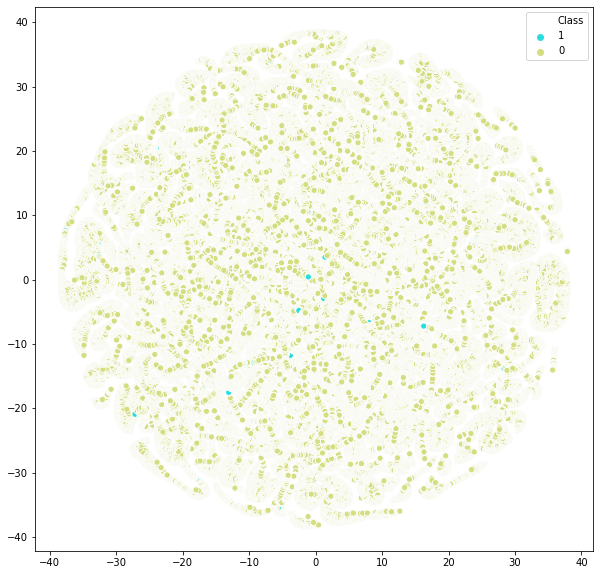

In [38]:
tsne = TSNE(n_components=2)
data_tsne_forest = tsne.fit_transform(isolation_forest_data)
plt.figure(figsize=(10,10))
sns.scatterplot(data_tsne_forest[:,0], data_tsne_forest[:,1], isolation_forest_data['Class'], palette='rainbow', hue_order=[1, 0],
             markers=['*', 'o'])

## BDSCAN

DBSCAN works slow, it always throw out of memory exceptions. Let skip this method

## Final Comapring

In [48]:
from sklearn.metrics import recall_score
print ("Recall Score Sigma: " + str(recall_score(y, sigma_outliers)) + "\n"
      "Recall Score IR: " + str(recall_score(y, IR_outliers)) + "\n"
      "Recall Score Distance-based: " + str(recall_score(y, euclidian_outliers)) + "\n" +
      "Recall Score SVM: " + str(recall_score(y, svm_outliers)) + "\n" + 
      "Recall score Isolation Forest: " +  str(recall_score(y, isolation_outliers)) )

Recall Score Sigma: 0.18089430894308944
Recall Score IR: 0.03048780487804878
Recall Score Distance-based: 0.036585365853658534
Recall Score SVM: 0.022357723577235773
Recall score Isolation Forest: 0.27439024390243905


We use Recall metric because we have approximately the same number of outliers for each model. We checked how many of these outliers are the real outliers. For this purpose we use recall score. The winner is isolation forrest. DBScan has the worst result.  SVM has the worst result among all models that finished calculations